In [37]:
import pandas as pd
import numpy as np
from pathlib import Path
import pickle
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score, accuracy_score, f1_score, log_loss
from catboost.utils import get_gpu_device_count

from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.svm import SVC

print('is GPU available? ->', get_gpu_device_count() > 0)

is GPU available? -> True


In [2]:
data_path = Path().absolute().parent/'data'
train = pd.read_csv(data_path/'processed_train_data.csv', index_col=0)
X = train.drop(columns='outcome')
y = train['outcome']

In [3]:
outcome_mapping = {'died': 0, 'euthanized': 1, 'lived': 2}
y = np.array([outcome_mapping[i] for i in y])
X = X.to_numpy()

In [4]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [21]:
class Classifier:
    def __init__(self) -> None:
        self.random_state = 42
        self.models = self.__define_models()
        self.scores = dict()


    def get_best_model(self):
        name = max(self.scores, key=self.scores.get)
        return self.models[name]


    def train_models(self, X_train, y_train, X_val, y_val):
        for name, model in self.models.items():
            print(f'{name} training phase')
            model_grid = self.__params_grid[name]
            grid_search = GridSearchCV(estimator=model, param_grid=model_grid, scoring='roc_auc_ovr', cv=5)
            if name == 'XGBoost' or name == 'CatBoost':
                grid_search.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])
            else:
                grid_search.fit(X_train, y_train)
            self.models[name] = grid_search.best_estimator_

            print('Лучшие гиперпараметры в модели:', grid_search.best_params_)
            self.__display_metrics(name)

            y_proba = self.models[name].predict_proba(X_val)
            y_pred = self.models[name].predict(X_val)
            roc_auc = roc_auc_score(y_val, y_proba, multi_class='ovr')
            accuracy = accuracy_score(y_val, y_pred)
            f1 = f1_score(y_val, y_pred, average='weighted')
            self.scores[name] = [roc_auc, accuracy, f1]
        self.__display_scores()
            

    def __display_metrics(self, name):
        if name == 'XGBoost':
            self.__display_xgboost(name)
        elif name == 'CatBoost':
            self.__display_catboost(name)
        elif name == 'HistGradientBoosting':
            self.__display_histboost(name)

        
    def __display_catboost(self, name):
        results = self.models[name].evals_result_
        metrics = ['MultiClass']

        epochs = len(results['validation_0'][metrics[0]])
        x_axis = range(0, epochs)

        fig, ax = plt.subplots(figsize=(6, 5))
        ax.plot(x_axis, results['validation_0']['MultiClass'], label='Train')
        ax.plot(x_axis, results['validation_1']['MultiClass'], label='Test')
        ax.set_xlabel('epochs')
        ax.set_ylabel('Logloss')
        ax.legend()
        fig.suptitle(name)
        plt.show()

    def __display_xgboost(self, name):
        results = self.models[name].evals_result()
        metrics = ['auc', 'mlogloss']

        epochs = len(results['validation_0']['auc'])
        x_axis = range(0, epochs)

        fig, ax = plt.subplots(1, 2, figsize=(12, 5))
        for i, metric in enumerate(metrics):
            ax[i].plot(x_axis, results['validation_0'][metric], label='Train')
            ax[i].plot(x_axis, results['validation_1'][metric], label='Test')
            ax[i].set_xlabel('epochs')
            ax[i].set_ylabel(['AUC', 'Logloss'][i])
            ax[i].legend()
        fig.suptitle(name)
        plt.show()


    def __display_histboost(self, name):
        model = self.models[name]
        roc_auc_train = [0]
        for i, y_pred in enumerate(model.staged_predict_proba(X_train)):
            roc_auc_train.append(roc_auc_score(y_train, y_pred, multi_class='ovr'))
        roc_auc_val = [0]
        for i, y_pred in enumerate(model.staged_predict_proba(X_val)):
            roc_auc_val.append(roc_auc_score(y_val, y_pred, multi_class='ovr'))
        logloss_train = [np.inf]
        for i, y_pred in enumerate(model.staged_predict_proba(X_train)):
            logloss_train.append(log_loss(y_train, y_pred, labels=[0, 1, 2]))
        logloss_val = [np.inf]
        for i, y_pred in enumerate(model.staged_predict_proba(X_val)):
            logloss_val.append(log_loss(y_val, y_pred, labels=[0, 1, 2]))

        x_axis = range(len(roc_auc_train))

        fig, ax = plt.subplots(1, 2, figsize=(12, 5))
        ax[0].plot(x_axis, roc_auc_train, label='Train')
        ax[0].plot(x_axis, roc_auc_val, label='Test')
        ax[0].set_xlabel('epochs')
        ax[0].set_ylabel('AUC')
        ax[0].set_xticks(ticks=x_axis[::5], labels=np.array(x_axis[::5])*4)
        ax[0].legend()

        ax[1].plot(x_axis, logloss_train, label='Train')
        ax[1].plot(x_axis, logloss_val, label='Test')
        ax[1].set_xlabel('epochs')
        ax[1].set_ylabel('LogLoss')
        ax[1].set_xticks(ticks=x_axis[::5], labels=np.array(x_axis[::5])*4)
        ax[1].legend()

        fig.suptitle('Hist Gradient Boosting')

        plt.show()



    def __display_scores(self):
        for key, scores in self.scores.items():
            print(f'{key}\n        ROC AUC score is {scores[0]};\n\
        f1 score is {scores[2]}\n        accuracy score is {scores[1]}\n')


    def __define_models(self):
        models = {
            'XGBoost': XGBClassifier(objective='multi:softmax', num_class=3, random_state=self.random_state,
                                     tree_method='hist', device='cuda', eval_metric=['auc', 'mlogloss']),
            'CatBoost': CatBoostClassifier(eval_metric = 'MultiClass', random_state=self.random_state),
            'HistGradientBoosting': HistGradientBoostingClassifier(early_stopping=True, max_iter=160, random_state=self.random_state),
            'SVM': SVC(decision_function_shape='ovr', probability=True, random_state=self.random_state)
        }
        return models
    
    
    @property
    def __params_grid(self):
        xgb_params = {
            'max_depth': [3, 6, 9],
            'learning_rate': [0.1, 0.01],
            'n_estimators': [100, 150, 200]
        }
        cat_params = {
            'depth': [3, 5, 8],
            'learning_rate': [0.1, 0.01],
            'l2_leaf_reg': [1, 3, 5]
        }
        hgb_params = {
            'max_depth': [4, 6, 9],
            'learning_rate': [0.1, 0.01]
            }
        svm_params = {
            'kernel': ['poly', 'rbf', 'sigmoid'],
            'degree': [3, 5, 8]
        }

        model_params = {
            'XGBoost': xgb_params,
            'CatBoost': cat_params,
            'HistGradientBoosting': hgb_params, 
            'SVM': svm_params
        }
        return model_params

In [22]:
clf = Classifier()

XGBoost training phase
[0]	validation_0-auc:0.84357	validation_0-mlogloss:1.04911	validation_1-auc:0.79979	validation_1-mlogloss:1.05558
[1]	validation_0-auc:0.84571	validation_0-mlogloss:1.00636	validation_1-auc:0.80517	validation_1-mlogloss:1.01883
[2]	validation_0-auc:0.85145	validation_0-mlogloss:0.96978	validation_1-auc:0.81445	validation_1-mlogloss:0.98548
[3]	validation_0-auc:0.85242	validation_0-mlogloss:0.93731	validation_1-auc:0.81250	validation_1-mlogloss:0.95860
[4]	validation_0-auc:0.86107	validation_0-mlogloss:0.90827	validation_1-auc:0.81055	validation_1-mlogloss:0.93642
[5]	validation_0-auc:0.86529	validation_0-mlogloss:0.88242	validation_1-auc:0.81847	validation_1-mlogloss:0.91429
[6]	validation_0-auc:0.86875	validation_0-mlogloss:0.85848	validation_1-auc:0.82037	validation_1-mlogloss:0.89472
[7]	validation_0-auc:0.87120	validation_0-mlogloss:0.83791	validation_1-auc:0.81953	validation_1-mlogloss:0.87921
[8]	validation_0-auc:0.87355	validation_0-mlogloss:0.81946	valida

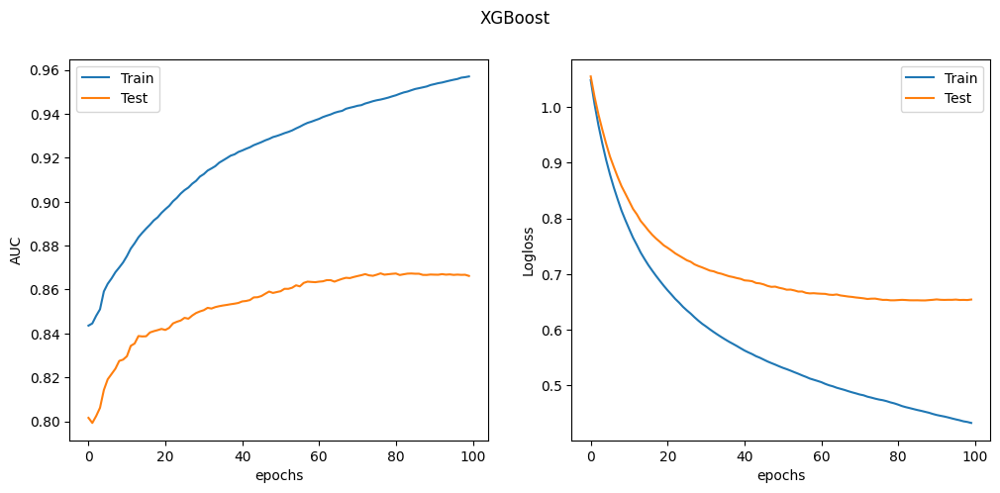

CatBoost training phase
0:	learn: 1.0654961	test: 1.0659352	test1: 1.0661908	best: 1.0661908 (0)	total: 944us	remaining: 944ms
1:	learn: 1.0185630	test: 1.0191722	test1: 1.0258685	best: 1.0258685 (1)	total: 1.89ms	remaining: 941ms
2:	learn: 0.9896348	test: 0.9895680	test1: 1.0009562	best: 1.0009562 (2)	total: 2.76ms	remaining: 917ms
3:	learn: 0.9603181	test: 0.9606079	test1: 0.9760330	best: 0.9760330 (3)	total: 3.65ms	remaining: 909ms
4:	learn: 0.9359471	test: 0.9363658	test1: 0.9513589	best: 0.9513589 (4)	total: 4.58ms	remaining: 912ms
5:	learn: 0.9161592	test: 0.9172779	test1: 0.9289523	best: 0.9289523 (5)	total: 5.58ms	remaining: 925ms
6:	learn: 0.8985260	test: 0.8994025	test1: 0.9170951	best: 0.9170951 (6)	total: 6.47ms	remaining: 917ms
7:	learn: 0.8785322	test: 0.8788797	test1: 0.8967878	best: 0.8967878 (7)	total: 7.37ms	remaining: 914ms
8:	learn: 0.8639376	test: 0.8641947	test1: 0.8843246	best: 0.8843246 (8)	total: 8.29ms	remaining: 912ms
9:	learn: 0.8518065	test: 0.8520573	test1

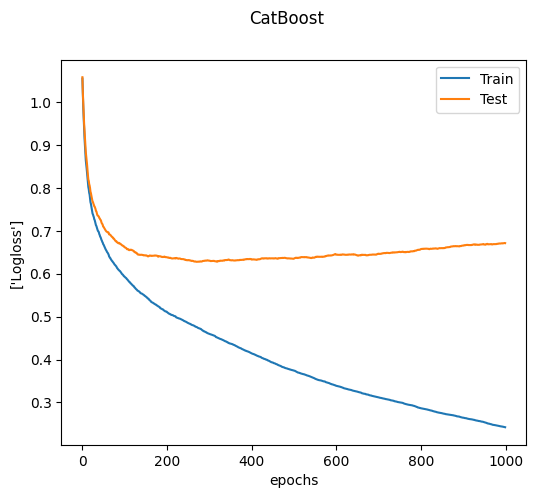

HistGradientBoosting training phase
Лучшие гиперпараметры в модели: {'learning_rate': 0.1, 'max_depth': 4}


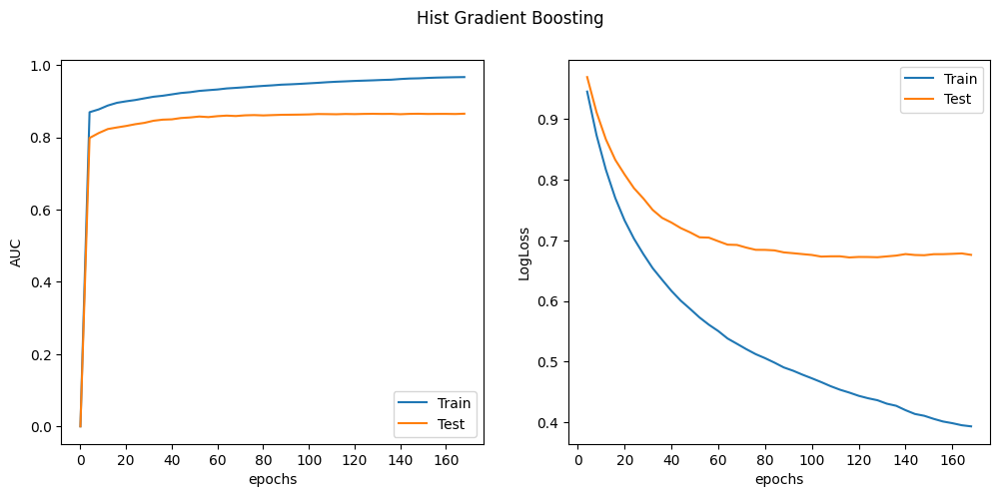

SVM training phase
Лучшие гиперпараметры в модели: {'degree': 5, 'kernel': 'poly'}
XGBoost
        ROC AUC score is 0.8725213718203199;
            f1 score is 0.753653971696564
        accuracy score is 0.7530364372469636

CatBoost
        ROC AUC score is 0.8828647947599118;
            f1 score is 0.7538836248669029
        accuracy score is 0.7530364372469636

HistGradientBoosting
        ROC AUC score is 0.8652048368000637;
            f1 score is 0.7375875253795842
        accuracy score is 0.7368421052631579

SVM
        ROC AUC score is 0.762970121706187;
            f1 score is 0.5459864593610723
        accuracy score is 0.5668016194331984



In [23]:
clf.train_models(X_train, y_train, X_val, y_val)

In [35]:
best_model = clf.get_best_model()
name = best_model.__class__.__name__

In [43]:
models_path = Path().absolute().parent/'models'
file_name = models_path/f'{name}.pickle'
pickle.dump(best_model, open(file_name, "wb"))